In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [2]:
import nltk
import pickle
import re
import string

from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Embedding, LSTM, SimpleRNN,Dense
from tensorflow.keras.initializers import Constant
from tensorflow.keras.models import Sequential

In [3]:
from tensorflow.compat.v1 import ConfigProto, InteractiveSession

config = ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.5
config.gpu_options.allow_growth = True
session = InteractiveSession(config = config)

### Load Dataset

In [4]:
pd.set_option("display.max_colwidth",200)
data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Dataset.csv")
data.head()

,review,sentiment
0,"One of the other reviewers has mentioned that after watching just 1 Oz episode you'll be hooked. They are right, as this is exactly what happened with me.<br /><br />The first thing that struck me...",positive
1,"A wonderful little production. <br /><br />The filming technique is very unassuming- very old-time-BBC fashion and gives a comforting, and sometimes discomforting, sense of realism to the entire p...",positive
2,"I thought this was a wonderful way to spend time on a too hot summer weekend, sitting in the air conditioned theater and watching a light-hearted comedy. The plot is simplistic, but the dialogue i...",positive
3,Basically there's a family where a little boy (Jake) thinks there's a zombie in his closet & his parents are fighting all the time.<br /><br />This movie is slower than a soap opera... and suddenl...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is a visually stunning film to watch. Mr. Mattei offers us a vivid portrait about human relations. This is a movie that seems to be telling us what mone...",positive


In [5]:
data.shape

(50000, 2)

In [6]:
data.describe()

,review,sentiment
count,50000,50000
unique,49582,2
top,"Loved today's show!!! It was a variety and not solely cooking (which would have been great too). Very stimulating and captivating, always keeping the viewer peeking around the corner to see what w...",positive
freq,5,25000


In [7]:
data.isnull().sum()

review       0
sentiment    0
dtype: int64

we can see, there are duplicate values cause of which there is size-mismatching in unique column and count .

In [8]:
data.sentiment.value_counts()

positive    25000
negative    25000
Name: sentiment, dtype: int64

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   review     50000 non-null  object
 1   sentiment  50000 non-null  object
dtypes: object(2)
memory usage: 781.4+ KB


making the copy original data

In [10]:
temp = data.copy()

In [11]:
temp.head()

,review,sentiment
0,"One of the other reviewers has mentioned that after watching just 1 Oz episode you'll be hooked. They are right, as this is exactly what happened with me.<br /><br />The first thing that struck me...",positive
1,"A wonderful little production. <br /><br />The filming technique is very unassuming- very old-time-BBC fashion and gives a comforting, and sometimes discomforting, sense of realism to the entire p...",positive
2,"I thought this was a wonderful way to spend time on a too hot summer weekend, sitting in the air conditioned theater and watching a light-hearted comedy. The plot is simplistic, but the dialogue i...",positive
3,Basically there's a family where a little boy (Jake) thinks there's a zombie in his closet & his parents are fighting all the time.<br /><br />This movie is slower than a soap opera... and suddenl...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is a visually stunning film to watch. Mr. Mattei offers us a vivid portrait about human relations. This is a movie that seems to be telling us what mone...",positive


In [12]:
temp.review[0]
#first column

"One of the other reviewers has mentioned that after watching just 1 Oz episode you'll be hooked. They are right, as this is exactly what happened with me.<br /><br />The first thing that struck me about Oz was its brutality and unflinching scenes of violence, which set in right from the word GO. Trust me, this is not a show for the faint hearted or timid. This show pulls no punches with regards to drugs, sex or violence. Its is hardcore, in the classic use of the word.<br /><br />It is called OZ as that is the nickname given to the Oswald Maximum Security State Penitentary. It focuses mainly on Emerald City, an experimental section of the prison where all the cells have glass fronts and face inwards, so privacy is not high on the agenda. Em City is home to many..Aryans, Muslims, gangstas, Latinos, Christians, Italians, Irish and more....so scuffles, death stares, dodgy dealings and shady agreements are never far away.<br /><br />I would say the main appeal of the show is due to the fa

We can see there are too many unnecessary things, which aren't required to perfrom sentimental analysis. We only require specific keywords to do that.

In [13]:
#dropping the duplicate values
temp = temp.drop_duplicates()

In [14]:
temp.head()

,review,sentiment
0,"One of the other reviewers has mentioned that after watching just 1 Oz episode you'll be hooked. They are right, as this is exactly what happened with me.<br /><br />The first thing that struck me...",positive
1,"A wonderful little production. <br /><br />The filming technique is very unassuming- very old-time-BBC fashion and gives a comforting, and sometimes discomforting, sense of realism to the entire p...",positive
2,"I thought this was a wonderful way to spend time on a too hot summer weekend, sitting in the air conditioned theater and watching a light-hearted comedy. The plot is simplistic, but the dialogue i...",positive
3,Basically there's a family where a little boy (Jake) thinks there's a zombie in his closet & his parents are fighting all the time.<br /><br />This movie is slower than a soap opera... and suddenl...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is a visually stunning film to watch. Mr. Mattei offers us a vivid portrait about human relations. This is a movie that seems to be telling us what mone...",positive


In [15]:
temp.shape
#duplicates dropped successfully

(49582, 2)

In [16]:
from sklearn.utils import shuffle
temp = shuffle(temp)
#shuffling the data so that we will get random values

In [17]:
temp.head(10)

,review,sentiment
44697,"Cut to the chase, this is one of the five worst films that I've ever seen.<br /><br />Not that they didn't try. There was some decent writing with some elements of structure in there, a good cast,...",negative
48493,"Distasteful, cliched thriller has young couple doing cross-country research on America's most infamous murder sites, becoming road partners with a dim-witted young woman and her snarling boyfriend...",negative
36803,CRY FREEDOM is an excellent primer for those wanting an overview of apartheid's cruelty in just a couple of hours. Famed director Richard Attenborough (GANDHI) is certainly no stranger to the genr...,positive
24137,"It would seem a given, but if a viewer forgets context, he risks missing an opportunity of enjoyment.<br /><br />It is easy to carp, from the lofty heights of the 21st century, at styles and price...",positive
3667,"Ernesto is a man that makes a living out of duping other solid citizens of their hard earned money. Together with Manco, an older man with a lot of experience, he pulls out capers that allow him t...",positive
31644,"What this movie is not: Cool, Entertaining<br /><br />What this movie is: Visually Interesting, Difficult to get through, Intentional<br /><br />I feel that this movie puts the viewer (if he or sh...",positive
4707,"This movie makes me want to throw up every time I see it. If you take the first movie, and reverse the plot (ariel wants to leave the sea, her daughter wants to go to the sea), take the same chara...",negative
30061,"Visconti's first film has all his trademark visual flair and immaculate technique, accompanied by compelling performances from Massimo Girotti as the handsome drifter and, best of all, Clara Calam...",positive
48526,"After a very disappointing Part 3, I kinda wondered if I should even bother with The Next Karate Kid, while I could see why this saga wouldn't continue, I still enjoyed The Next Karate Kid most ou...",positive
9486,"This movie appears to have been overlooked by everyone. Someone should bring it out on VHS and DVD. It is an excellent film and far superior to the one with Brooke Shields, which was terrible. <br...",positive


In [18]:
len(temp)

49582

In [19]:
temp.reset_index(inplace = True)

In [20]:
temp.head()

,index,review,sentiment
0,44697,"Cut to the chase, this is one of the five worst films that I've ever seen.<br /><br />Not that they didn't try. There was some decent writing with some elements of structure in there, a good cast,...",negative
1,48493,"Distasteful, cliched thriller has young couple doing cross-country research on America's most infamous murder sites, becoming road partners with a dim-witted young woman and her snarling boyfriend...",negative
2,36803,CRY FREEDOM is an excellent primer for those wanting an overview of apartheid's cruelty in just a couple of hours. Famed director Richard Attenborough (GANDHI) is certainly no stranger to the genr...,positive
3,24137,"It would seem a given, but if a viewer forgets context, he risks missing an opportunity of enjoyment.<br /><br />It is easy to carp, from the lofty heights of the 21st century, at styles and price...",positive
4,3667,"Ernesto is a man that makes a living out of duping other solid citizens of their hard earned money. Together with Manco, an older man with a lot of experience, he pulls out capers that allow him t...",positive


# Text Preprocessing

In [21]:
!nvidia-smi

Fri Nov 10 03:41:02 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   52C    P0    29W /  70W |    309MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [23]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [25]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [27]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [28]:
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
wn = nltk.WordNetLemmatizer()
stopwords = nltk.corpus.stopwords.words('english')

review_lines = list()
lines = temp['review'].values.tolist()

for line in lines:
  tokens = word_tokenize(line)
  tokens = [word.lower() for word in tokens]
  table = str.maketrans('','',string.punctuation)
  stripped = [w.translate(table) for w in tokens]
  words = [word for word in stripped if word.isalpha()]
  words = [wn.lemmatize(w) for w in words if w not in stopwords]
  review_lines.append(words)

In [29]:
len(review_lines)

49582

In [30]:
review_lines

[['cut',
  'chase',
  'one',
  'five',
  'worst',
  'film',
  'ever',
  'seen',
  'br',
  'br',
  'nt',
  'try',
  'decent',
  'writing',
  'element',
  'structure',
  'good',
  'cast',
  'good',
  'acting',
  'sure',
  'went',
  'wrong',
  'went',
  'horribly',
  'wrong',
  'br',
  'br',
  'element',
  'may',
  'bad',
  'structure',
  'substantive',
  'story',
  'lot',
  'overacting',
  'lead',
  'probably',
  'much',
  'better',
  'restrained',
  'bad',
  'directing',
  'editing',
  'enough',
  'hour',
  'tearing',
  'hair',
  'hour',
  'half',
  'agitated',
  'hour',
  'fifty',
  'minute',
  'ran',
  'also',
  'insincerity',
  'went',
  'someone',
  'used',
  'heroin',
  'addict',
  'agitated',
  'glamorized',
  'something',
  'nothing',
  'good',
  'bolstered',
  'pretty',
  'yearold',
  'girl',
  'love',
  'yearold',
  'junkie',
  'br',
  'br',
  'frantic',
  'nature',
  'lead',
  'turnoff',
  'enough',
  'clunky',
  'plot',
  'point',
  'attempt',
  'structure',
  'end',
  'resul

In [31]:
Y = temp['sentiment']

In [32]:
#convert labels in int
Y = np.asarray([1 if each =='positive' else 0 for each in Y])
X = review_lines

In [33]:
X

[['cut',
  'chase',
  'one',
  'five',
  'worst',
  'film',
  'ever',
  'seen',
  'br',
  'br',
  'nt',
  'try',
  'decent',
  'writing',
  'element',
  'structure',
  'good',
  'cast',
  'good',
  'acting',
  'sure',
  'went',
  'wrong',
  'went',
  'horribly',
  'wrong',
  'br',
  'br',
  'element',
  'may',
  'bad',
  'structure',
  'substantive',
  'story',
  'lot',
  'overacting',
  'lead',
  'probably',
  'much',
  'better',
  'restrained',
  'bad',
  'directing',
  'editing',
  'enough',
  'hour',
  'tearing',
  'hair',
  'hour',
  'half',
  'agitated',
  'hour',
  'fifty',
  'minute',
  'ran',
  'also',
  'insincerity',
  'went',
  'someone',
  'used',
  'heroin',
  'addict',
  'agitated',
  'glamorized',
  'something',
  'nothing',
  'good',
  'bolstered',
  'pretty',
  'yearold',
  'girl',
  'love',
  'yearold',
  'junkie',
  'br',
  'br',
  'frantic',
  'nature',
  'lead',
  'turnoff',
  'enough',
  'clunky',
  'plot',
  'point',
  'attempt',
  'structure',
  'end',
  'resul

In [34]:
Y

array([0, 0, 1, ..., 0, 1, 1])

### saving the processed data

In [35]:
pickle_out = open('X.pickle','wb')
pickle.dump(X,pickle_out)
pickle_out.close()

pickle_out = open('Y.pickle','wb')
pickle.dump(Y,pickle_out)
pickle_out.close()

In [36]:
#loading the data

x = pickle.load(open('X.pickle','rb'))
y = pickle.load(open('Y.pickle','rb'))

In [37]:
x

[['cut',
  'chase',
  'one',
  'five',
  'worst',
  'film',
  'ever',
  'seen',
  'br',
  'br',
  'nt',
  'try',
  'decent',
  'writing',
  'element',
  'structure',
  'good',
  'cast',
  'good',
  'acting',
  'sure',
  'went',
  'wrong',
  'went',
  'horribly',
  'wrong',
  'br',
  'br',
  'element',
  'may',
  'bad',
  'structure',
  'substantive',
  'story',
  'lot',
  'overacting',
  'lead',
  'probably',
  'much',
  'better',
  'restrained',
  'bad',
  'directing',
  'editing',
  'enough',
  'hour',
  'tearing',
  'hair',
  'hour',
  'half',
  'agitated',
  'hour',
  'fifty',
  'minute',
  'ran',
  'also',
  'insincerity',
  'went',
  'someone',
  'used',
  'heroin',
  'addict',
  'agitated',
  'glamorized',
  'something',
  'nothing',
  'good',
  'bolstered',
  'pretty',
  'yearold',
  'girl',
  'love',
  'yearold',
  'junkie',
  'br',
  'br',
  'frantic',
  'nature',
  'lead',
  'turnoff',
  'enough',
  'clunky',
  'plot',
  'point',
  'attempt',
  'structure',
  'end',
  'resul

In [38]:
y

array([0, 0, 1, ..., 0, 1, 1])

#Training Word2vec Embedding

The performance of google word2vec is better on big datasets

In this example we are considering only 50000 training examples from the imdb dataset.

In [39]:
import gensim

In [40]:
#training word2vec model --

model = gensim.models.Word2Vec(sentences = x, vector_size = 100, window = 5, workers = 4, min_count =1)

# Testing Word2Vec Model

In [41]:
model.wv.most_similar('horrible')

[('terrible', 0.9211090207099915),
 ('awful', 0.8746282458305359),
 ('horrendous', 0.8176921010017395),
 ('atrocious', 0.7797547578811646),
 ('dreadful', 0.7719355821609497),
 ('suck', 0.7642922401428223),
 ('pathetic', 0.7632941007614136),
 ('horrid', 0.7557967901229858),
 ('laughable', 0.7438410520553589),
 ('bad', 0.7351536154747009)]

let's see the result of semantically resonable word vector (king man + woman)

In [42]:
model.wv.most_similar_cosmul(positive = ['woman','king'],negative = ['man'])

[('bluewhitered', 0.874761700630188),
 ('queen', 0.8343613147735596),
 ('princess', 0.8330337405204773),
 ('reprint', 0.8268131017684937),
 ('neardisaster', 0.8213363289833069),
 ('uramibushi', 0.8181741833686829),
 ('gothfest', 0.8153401613235474),
 ('minibio', 0.8147448897361755),
 ('defininitive', 0.8137194514274597),
 ('velda', 0.813356339931488)]

This is very interesting to see the word embedding learned by our word2vec model from the text corpus. The next step is to use the word embeddings directly in thr embedding layer in our sentiment classification model. We can save the model to be used later.

In [43]:
#saving the embedding model
filename = 'imdb_word2vec_embedding.txt'
model.wv.save_word2vec_format(filename, binary = False)

# Use Pre-trained Embedding

##### Since we have already trained word2vec model with IMDB dataset, we have the word embeddings ready to use. The next step is to load the word embedding as a directory of words to vectors. The word embedding was saved in file "imdb_embedding_word2vec.txt". Let's extract the word embedding from the stored file.

In [44]:
import os

embeddings_index = {}
f = open(os.path.join('','imdb_word2vec_embedding.txt'), encoding = 'utf-8')


for line in f:
  values = line.split()
  word = values[0]
  coefs = np.asarray(values[1:],dtype ='float32')
  embeddings_index[word] = coefs

f.close()

The next step is to convert the word embedding into tokenized vector. Recall that the review documents are interger encoded prior to passing them to the Embedding layer. The integer maps to the index of a specific vector in the embedding layer. Therefore,it is important that we lay the vectors out in the Embedding layer such that the encoded words map to the correct vector.

In [45]:
#vectorizing the text samples into a 2D ineger tensor

tokenizer_obj = Tokenizer()
tokenizer_obj.fit_on_texts(x)
sequences = tokenizer_obj.texts_to_sequences(x)


#pad sequences
word_index = tokenizer_obj.word_index
print('Found %s unique tokens.' % len(word_index))

review_pad = pad_sequences(sequences, maxlen = 2100)
print('Shape of review tensor:', review_pad.shape)


Found 123741 unique tokens.
Shape of review tensor: (49582, 2100)


In [46]:
review_pad[0]
#data

array([  0,   0,   0, ...,  73,  60, 189], dtype=int32)

In [47]:
print('shpae of label tensor: ',y.shape)

shpae of label tensor:  (49582,)


In [48]:
y[0]
#label

0

Now we will map embeddings from the loaded word2vec model for each word to the (tokenizer_obj.word_index) vocabulary and create a matrix with word vectors.

In [49]:
EMBEDDING_DIM = 100

num_words = len(word_index)+1
embedding_matrix = np.zeros((num_words, EMBEDDING_DIM))

for word, i in word_index.items():
    if i < num_words:
        embedding_vector = embeddings_index.get(word)
        if embedding_vector is not None:
            embedding_matrix[i] = embedding_vector

In [50]:
print(num_words)

123742


In [51]:
#split our data
Validation_split = 0.1

indices = np.arange(review_pad.shape[0])
np.random.shuffle(indices)
review_pad = review_pad[indices]
sentiment = y[indices]
num_validation_samples = int(Validation_split * review_pad.shape[0])

x_train = review_pad[:-num_validation_samples]
y_train = sentiment[:-num_validation_samples]
x_val = review_pad[-num_validation_samples:]
y_val = sentiment[-num_validation_samples:]

In [52]:
print('Shape of x_train tensor:', x_train.shape)
print('Shape of y_train tensor:', y_train.shape)
print('Shape of x_val tensor:', x_val.shape)
print('Shape of y_val tensor:', y_val.shape)

Shape of x_train tensor: (44624, 2100)
Shape of y_train tensor: (44624,)
Shape of x_val tensor: (4958, 2100)
Shape of y_val tensor: (4958,)


In [53]:
x_train[0]

array([  0,   0,   0, ...,   5, 259, 785], dtype=int32)

In [54]:
idx = tokenizer_obj.word_index
inverse_map = dict(zip(idx.values(), idx.keys()))

def return_to_sentence(tokens):
    words = [inverse_map[token] for token in tokens if token!=0]
    text = ' '.join(words)
    return text


In [55]:
print(return_to_sentence(x_train[0]))

something wonderful revenge film everyone wake morning believing heshe star movie anyone interferes one personal agenda way enemy revenge plot film work particularly well person low selfesteem rather fighting back moment hero draw upon builtup inner anxiety engage single act power attempt restore equilibrium quite naturally real world type revenge seldom relief tension life movie revenge enacted action taken consequence good revenge flick help people ignore bitter pill movie end credit roll responsibility resolved br br swimming shark advertised comedy doubt act part producer figure sell oddity dark nt dark comedy company men work todd solondz come much closer part film brutal predate current tortureporn genre everyone obsessed saw hostel laugh laugh saving private ryan nt labeled comedy br br intrinsic problem film nt earned revenge case ostensibly young man abused bos eventually take bos hostage pay back mistreatment hero aptly named guy everyman vague know literally nothing spare ti

In [56]:
y_train[0]

0

In [57]:
#model building
model = Sequential()
embedding_layer = Embedding(num_words,100,weights = [embedding_matrix],
                            trainable = False )

model.add(embedding_layer)
model.add(SimpleRNN(units =50))

model.add(Dense(1, activation = 'sigmoid'))

model.compile(loss = "binary_crossentropy",optimizer ="rmsprop",metrics=["accuracy"])

In [58]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, None, 100)         12374200  
                                                                 
 simple_rnn (SimpleRNN)      (None, 50)                7550      
                                                                 
 dense (Dense)               (None, 1)                 51        
                                                                 
Total params: 12381801 (47.23 MB)
Trainable params: 7601 (29.69 KB)
Non-trainable params: 12374200 (47.20 MB)
_________________________________________________________________


In [84]:
history = model.fit(x_train, y_train, batch_size = 128, epochs = 10, validation_split = 0.2,shuffle=True, verbose = 1)

Epoch 1/10
279/279 [==============================] - 455s 2s/step - loss: 0.4643 - accuracy: 0.7955 - val_loss: 0.4666 - val_accuracy: 0.7914
Epoch 2/10
279/279 [==============================] - 445s 2s/step - loss: 0.4645 - accuracy: 0.7926 - val_loss: 0.5356 - val_accuracy: 0.7490
Epoch 3/10
279/279 [==============================] - 434s 2s/step - loss: 0.4514 - accuracy: 0.8034 - val_loss: 0.4404 - val_accuracy: 0.8134
Epoch 4/10
279/279 [==============================] - 431s 2s/step - loss: 0.4642 - accuracy: 0.7913 - val_loss: 0.6507 - val_accuracy: 0.6593
Epoch 5/10
279/279 [==============================] - 433s 2s/step - loss: 0.4596 - accuracy: 0.7962 - val_loss: 0.4516 - val_accuracy: 0.8026
Epoch 6/10
279/279 [==============================] - 436s 2s/step - loss: 0.4554 - accuracy: 0.8004 - val_loss: 0.4968 - val_accuracy: 0.7685
Epoch 7/10
279/279 [==============================] - 439s 2s/step - loss: 0.4454 - accuracy: 0.8041 - val_loss: 0.4626 - val_accuracy: 0.7805

As we see in 10 epochs our model got 80% val_accuracy if we train more then we can reach 90%

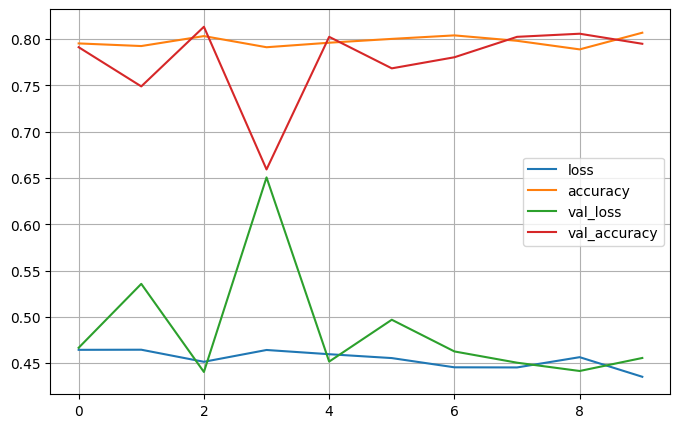

In [85]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.show()

In [87]:
y_pred = (model.predict(x_val) > 0.5).astype("int32")
true = 0
for i, y in enumerate(y_val):
    if y == y_pred[i]:
        true += 1

print('Correct Prediction: {}'.format(true))
print('Wrong Prediction: {}'.format(len(y_pred) - true))
print('Accuracy: {}'.format(true/len(y_pred)*100))

155/155 [==============================] - 26s 169ms/step
Correct Prediction: 3937
Wrong Prediction: 1021
Accuracy: 79.40701895925777


In [88]:
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

In [89]:
pred_y = model.predict(x_val)

155/155 [==============================] - 26s 171ms/step


In [90]:
pred_y[:10]

array([[0.07792789],
       [0.7586145 ],
       [0.14238915],
       [0.8300641 ],
       [0.0524452 ],
       [0.0339238 ],
       [0.7684783 ],
       [0.83123714],
       [0.6278778 ],
       [0.29802808]], dtype=float32)

In [91]:
pred = (model.predict(x_val) > 0.5).astype("int32")

155/155 [==============================] - 25s 158ms/step


In [92]:
pred[:10]

array([[0],
       [1],
       [0],
       [1],
       [0],
       [0],
       [1],
       [1],
       [1],
       [0]], dtype=int32)

In [93]:
cm= confusion_matrix(y_val,y_val)
cm

array([[2423,    0],
       [   0, 2535]])

In [94]:
cm= confusion_matrix(pred,y_val)
cm

array([[2015,  613],
       [ 408, 1922]])

In [95]:
test1 = "The movie is fantastic! "
test2 = "bad"

test = [test1,test2]
test_sam = tokenizer_obj.texts_to_sequences(test)
test_sam_pad = pad_sequences(test_sam,maxlen = 50)

a = (model.predict(x=test_sam_pad) > 0.5).astype("int32")

1/1 [==============================] - 0s 20ms/step


In [96]:
a
#1 : positive
#0 : negative

array([[0],
       [0]], dtype=int32)

In [97]:
print(classification_report(pred,y_val))

              precision    recall  f1-score   support

           0       0.83      0.77      0.80      2628
           1       0.76      0.82      0.79      2330

    accuracy                           0.79      4958
   macro avg       0.79      0.80      0.79      4958
weighted avg       0.80      0.79      0.79      4958

